In [1]:
import os
import json

import torch
import torch.nn as nn
import torch.backends.cudnn as cudnn

import numpy as np
import cv2 as cv
from skimage.io import imread, imsave
from skimage.util import img_as_float, img_as_float32, img_as_ubyte
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from tqdm.notebook import tqdm, trange
import matplotlib.pyplot as plt
import scipy.io as sio

from utils import weights_init_xavier
from models import PATvidx4
from mh_utils import MultiSeqSet, PatvidxrSlowflowSet, _project_rescale_grid
from mh_utils import _to_npimg, _to_tensor, _2d_patch_crop, _2d_patch_combine, move_pixel_value

## Prepare Network

In [2]:
device = 'cuda:0'
weight_file = './weights/best.pth.tar'
pretrained_dict = torch.load(weight_file)
net = PATvidx4().to(device)
net = nn.DataParallel(net)
net.eval()
cudnn.benchmark = True
net.load_state_dict(pretrained_dict['state_dict'])

print("Loading weight from: {:s}. It's epoch {:d} with validation PSNR {:.2f}".format(weight_file, pretrained_dict['epoch'], pretrained_dict['psnr']))

Loading weight from: ./weights/best.pth.tar. It's epoch 100 with validation PSNR 28.92


## Test on training set

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


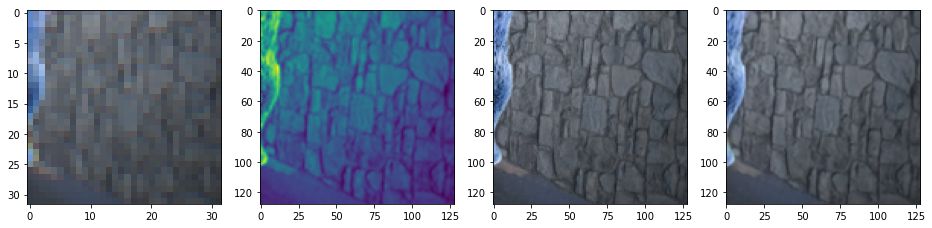

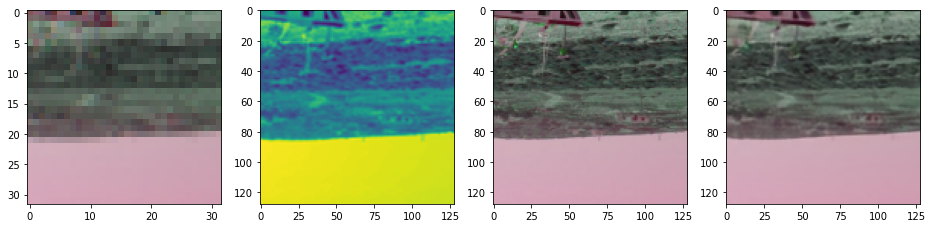

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


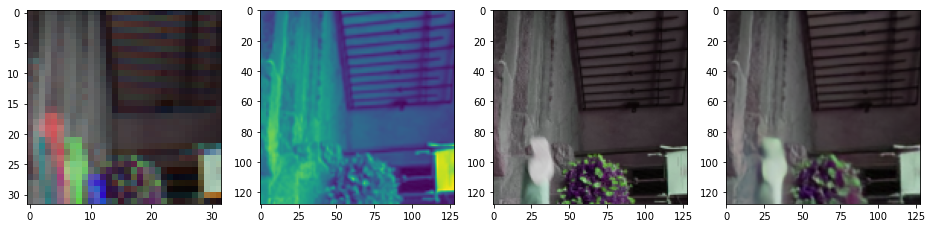

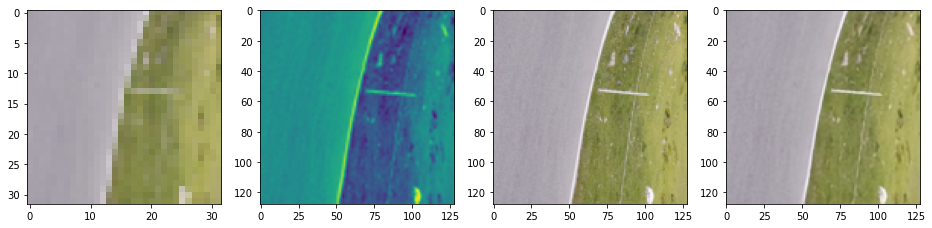

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


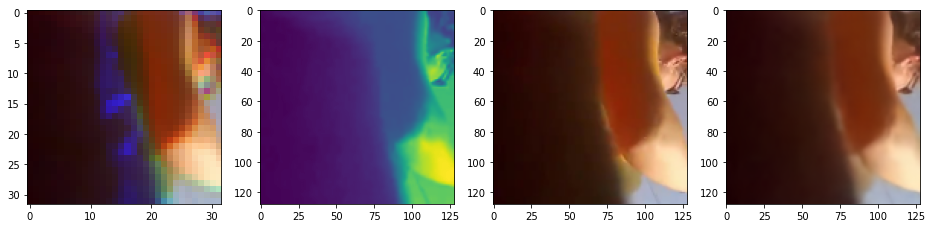

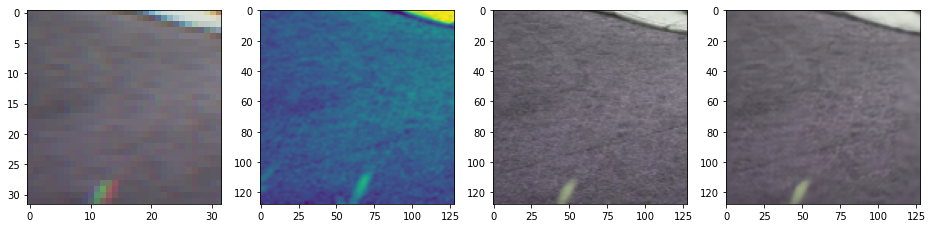

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


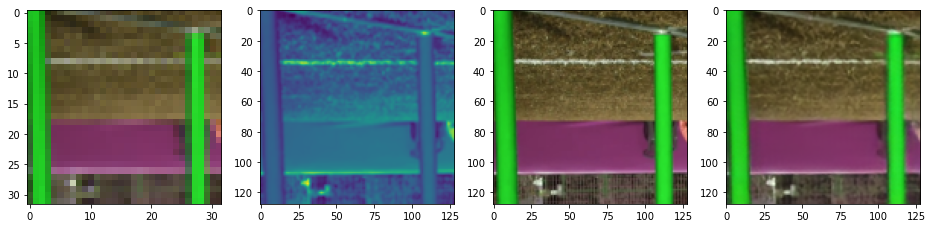

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


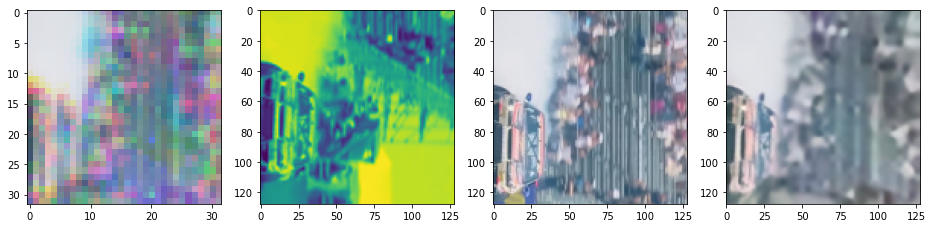

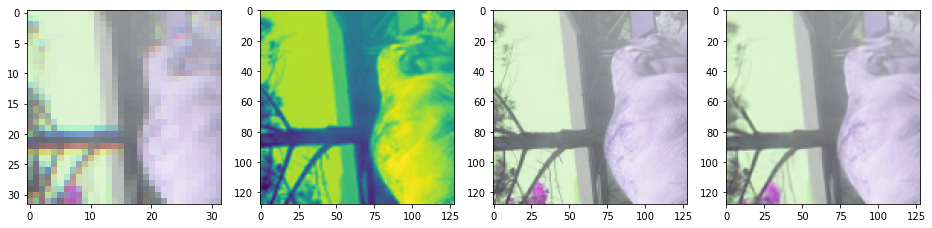

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


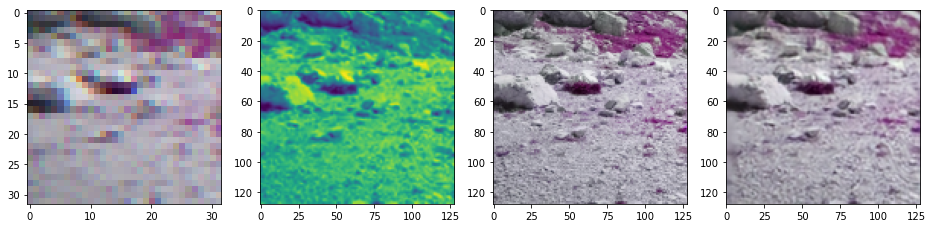

In [5]:
sample_set = MultiSeqSet('/xdisk/djbrady/mh432/DAVIS_PAT_trainval_128p/train/', rng=np.random.default_rng(42), 
                        lr_hw=3, hr_hw=9)
sample_idx = np.arange(0, 10000, 1000)
for sidx in sample_idx:
    in_tuple, gt = sample_set[sidx]
    in_tuple = [x[None].to(device) for x in in_tuple]
    gt_in = gt[None].to(device)
    lr_ins, hr_in, poss = in_tuple[:3], in_tuple[3], in_tuple[4:]
    with torch.no_grad():
        pred, _ = net(lr_ins, hr_in, 0, poss) # (1, 3, ph, pw)
    fig, axes = plt.subplots(1, 4, figsize=(16,4))
    for img, ax in zip([np.stack([_to_npimg(lr_ins[a].cpu()[0]) for a in [1,0,2]], axis=-1), 
                        _to_npimg(hr_in.cpu()[0]), 
                        _to_npimg(gt_in.cpu()[0]), 
                        _to_npimg(pred.cpu()[0])], 
                       axes.flatten()):
        ax.imshow(img)
    plt.show()

## Test on validation set

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


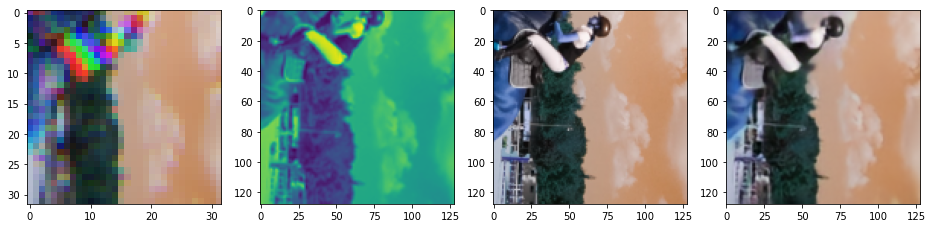

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


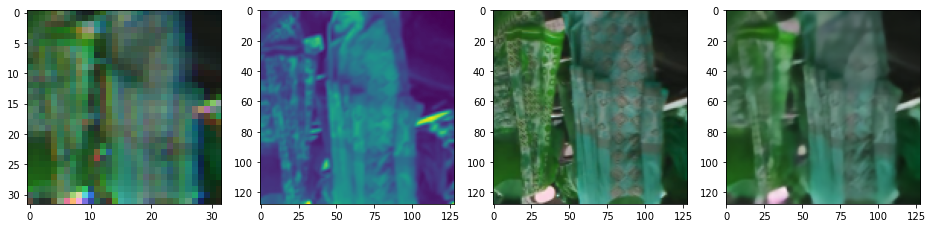

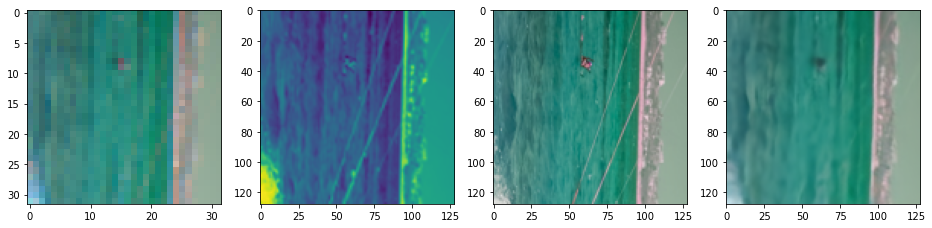

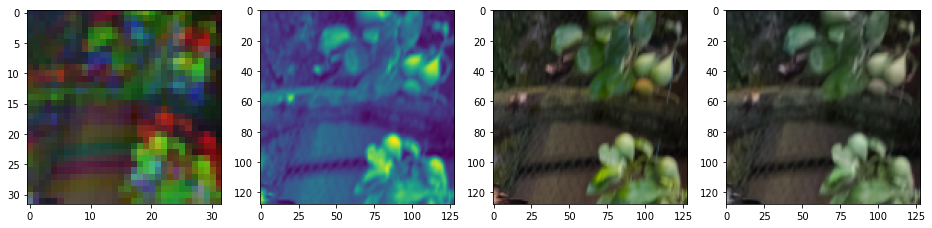

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


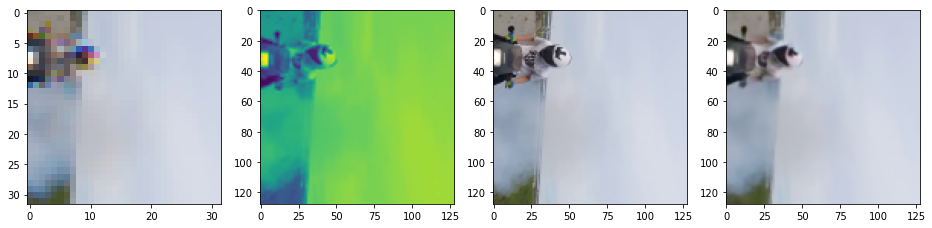

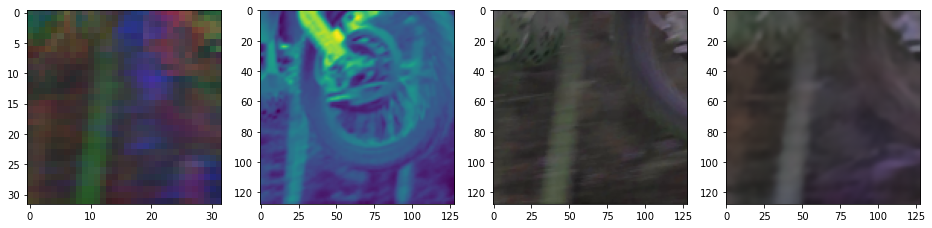

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


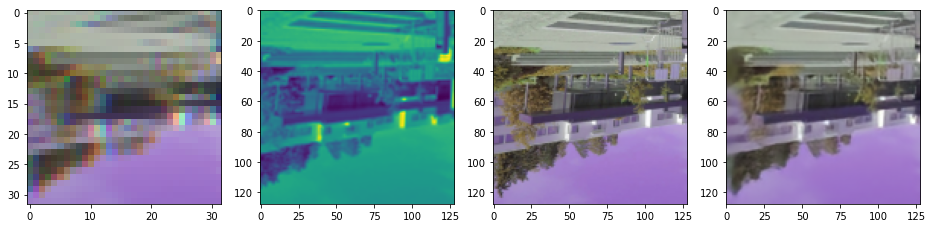

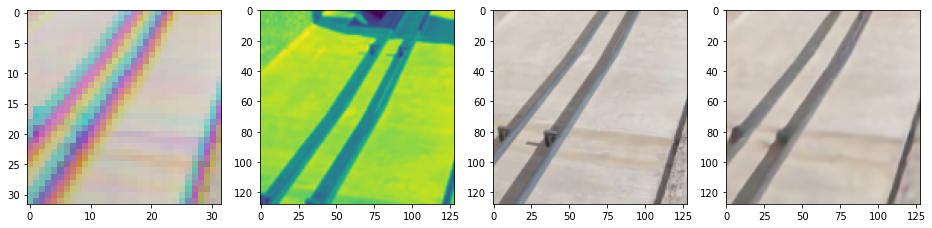

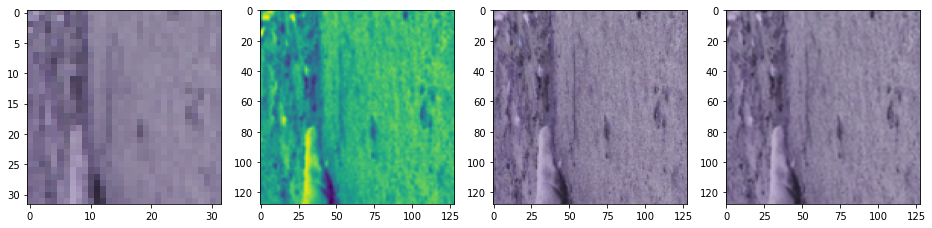

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


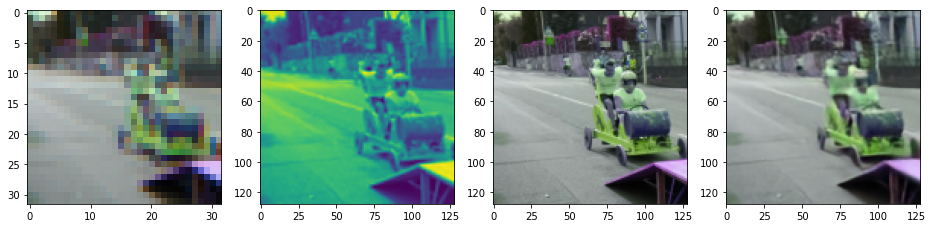

In [6]:
sample_set = MultiSeqSet('/xdisk/djbrady/mh432/DAVIS_PAT_trainval_128p/valid/', rng=np.random.default_rng(42), 
                        lr_hw=3, hr_hw=9)
sample_idx = np.arange(0, 5000, 500)
for sidx in sample_idx:
    in_tuple, gt = sample_set[sidx]
    in_tuple = [x[None].to(device) for x in in_tuple]
    gt_in = gt[None].to(device)
    lr_ins, hr_in, poss = in_tuple[:3], in_tuple[3], in_tuple[4:]
    with torch.no_grad():
        pred, _ = net(lr_ins, hr_in, 0, poss) # (1, 3, ph, pw)
    fig, axes = plt.subplots(1, 4, figsize=(16,4))
    for img, ax in zip([np.stack([_to_npimg(lr_ins[a].cpu()[0]) for a in [1,0,2]], axis=-1), 
                        _to_npimg(hr_in.cpu()[0]), 
                        _to_npimg(gt_in.cpu()[0]), 
                        _to_npimg(pred.cpu()[0])], 
                       axes.flatten()):
        ax.imshow(img)
    plt.show()

## Prepare data to inference

In [10]:
# source data
src_folder = os.path.join('/groups/djbrady/minghao/pat_slowflow/horses__000028/', 
                          'gt_rgb') # source data folder
csratio = 8 # compressive ratio
res_gap = 4
ptd = PatvidxrSlowflowSet(src_folder, csratio, 
                          lr_down_fac=res_gap, hr_down_fac=1/np.sqrt(1-csratio/res_gap**2)) # data loader
_, _, gtimg, _ = ptd[0]
gt_wh = (gtimg.shape[1], gtimg.shape[0])
del gtimg
src_idx_list = np.arange(168, 175)

# divide into patches
tgt_mn = (2,2)
m, n = tgt_mn
pad = 48

# attention search parameters
lr_hw = 4
hr_hw = 12

# saving parameter
if src_folder[-1]=='/':
    src_folder = src_folder[:-1]
label = os.path.split(os.path.split(src_folder)[0])[1]
tgt_folder = os.path.join('results', label) # target data folder
if not os.path.exists(tgt_folder):
    os.mkdir(tgt_folder)
    
print("Loading data from: {:s}".format(ptd.data_folder))
print("Saving predicted images to: {:s}".format(tgt_folder))

Loading data from: /groups/djbrady/minghao/pat_slowflow/horses__000028/gt_rgb
Saving predicted images to: results/horses__000028


## Test several key frames

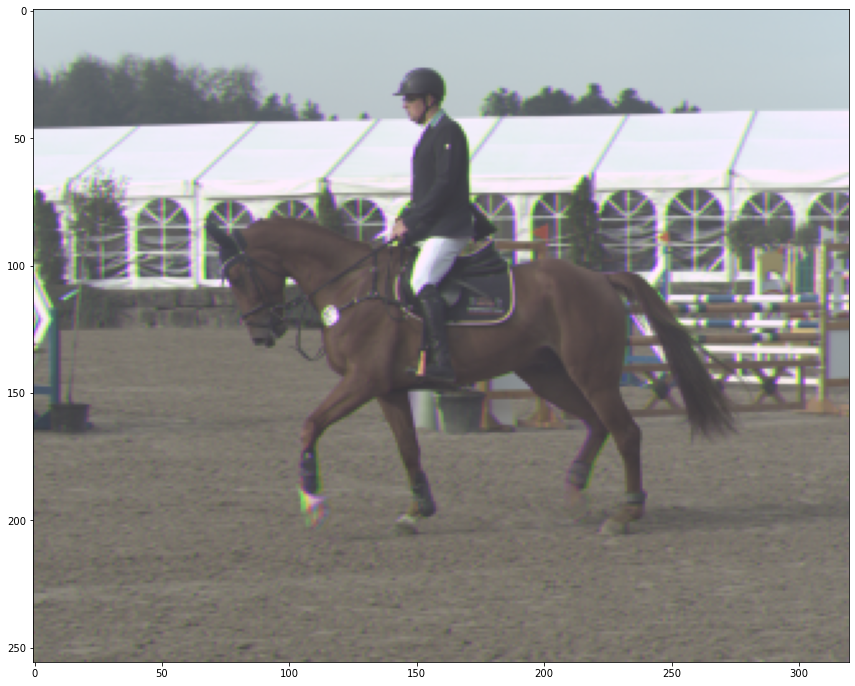

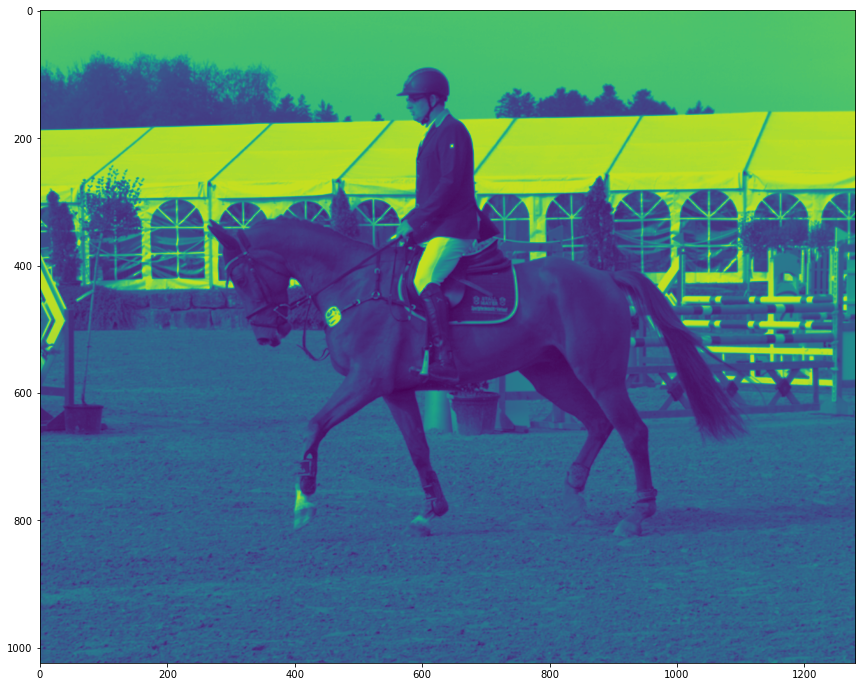

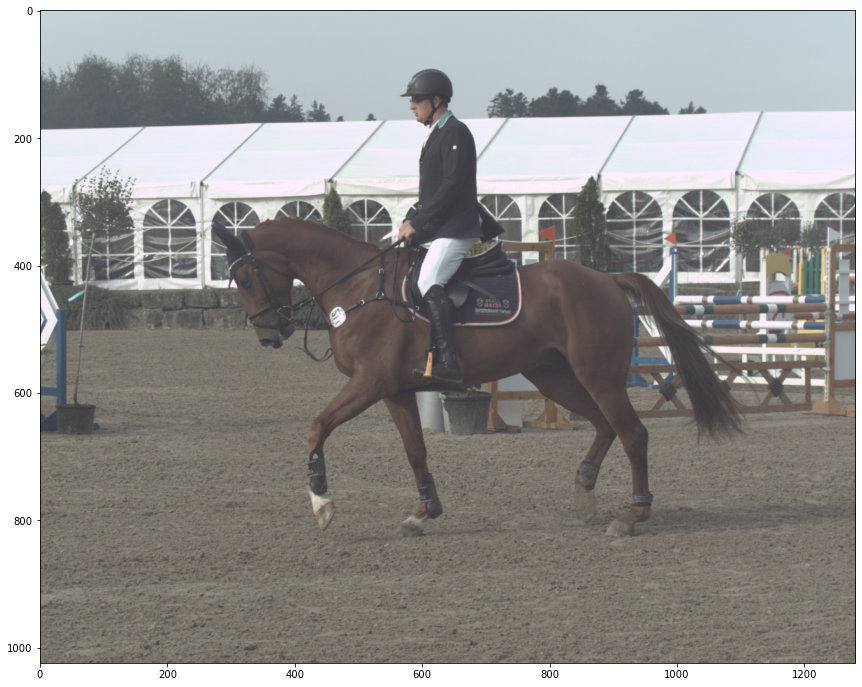

In [11]:
lr_list, hr, gt, lr_channel_list = ptd[src_idx_list[0]]
lr_trivial_stack = np.stack(lr_list, axis=-1)[...,lr_channel_list]
u_list = np.mean(lr_trivial_stack, axis=(0,1))
s_list = np.std(lr_trivial_stack, axis=(0,1))
for img in [lr_trivial_stack, hr, gt]:
    plt.figure(figsize=(16,12))
    plt.imshow(img)
    plt.show()

In [12]:
# crop images to patches
lr_stack_list = [_2d_patch_crop(img, tgt_mn, pad//res_gap) for img in lr_list]
hr_gt_stack = [_2d_patch_crop(img, tgt_mn, pad) for img in [hr, gt]]
five_stack_list = (*lr_stack_list, *hr_gt_stack)

In [13]:
# find project grid
bs, h, w = five_stack_list[0].shape
lr_yys, lr_xxs = _project_rescale_grid((w,h), (w,h), lr_hw, 1)
hr_yys, hr_xxs = _project_rescale_grid((w,h), (w,h), hr_hw, 1)
pos_tuple = (np.stack([lr_xxs, lr_yys], axis=0).astype(np.int16), 
             np.stack([lr_xxs, lr_yys], axis=0).astype(np.int16), 
             np.stack([hr_xxs, hr_yys], axis=0).astype(np.int16))

In [14]:
torch.cuda.empty_cache()
# loop through patches
predp_list = []
for lr1p, lr2p, lr3p, hrp, gtp in zip(*five_stack_list):
    # convert one patch set to tensors
    lr_ins = [_to_tensor(img)[None].to(device) for img in (lr1p, lr2p, lr3p)]
    hr_in = _to_tensor(hrp)[None].to(device)
    gt_in = _to_tensor(gtp)[None].to(device)
    poss = [torch.from_numpy(pos[np.newaxis,...]).to(device) for pos in pos_tuple]
    # go through network
    with torch.no_grad():
        predp, _ = net(lr_ins, hr_in, 0, poss) # (1, 3, ph, pw)
        predp_list.append(_to_npimg(predp[0].cpu()))
# clean GPU memory
torch.cuda.empty_cache()
# combine pred patches
pred = _2d_patch_combine(np.array(predp_list), tgt_mn, pad)
# put back channels
pred = pred[...,np.array([1,0,2])[lr_channel_list]]
# scale channels
pred_t = np.copy(pred)
for a,u,s in zip(range(3), u_list, s_list):
    pred_t[a] = move_pixel_value(pred_t[a], u, s)
# clip
pred = np.clip(pred, 0, 1)
pred_t = np.clip(pred_t, 0, 1)

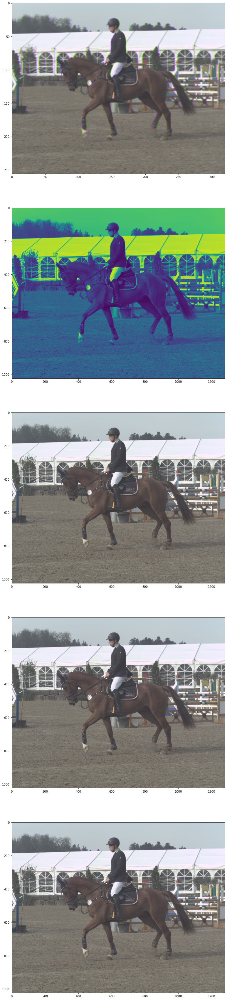

In [15]:
fig, axes = plt.subplots(5, 1, figsize=(16, 62))
for img, ax in zip([lr_trivial_stack, 
                    hr, gt, pred, pred_t], 
                    axes.flatten()):
    ax.imshow(img)
plt.show()

In [16]:
psnr = peak_signal_noise_ratio(gt, pred, data_range=1.0)
ssim = structural_similarity(gt, pred, data_range=1.0, channel_axis=-1,
                             gaussian_weights=True, sigma=1.5, use_sample_covariance=False)
print("PSNR: {:.2f}, SSIM: {:.4f}".format(psnr, ssim))

PSNR: 36.89, SSIM: 0.9496


In [20]:
def _compare_aois(lr, hr, pat, cacti, gt, aoi_list):
    n_aoi = len(aoi_list)
    fig, axes = plt.subplots(2*n_aoi, 3, figsize=(15, 10*n_aoi))
    axes = axes.reshape(-1, 6)
    for axrow, aoi in zip(axes, aoi_list):
        for ax, img, label in zip(axrow, 
                                  (lr, hr, pat, None, cacti, gt),
                                  ('PAT LR', 'PAT HR', 'PAT PRED', 'blank', 'CACTI PRED', 'GT')):
            if img is not None:
                ax.imshow(img[aoi])
            ax.set_title(label)
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


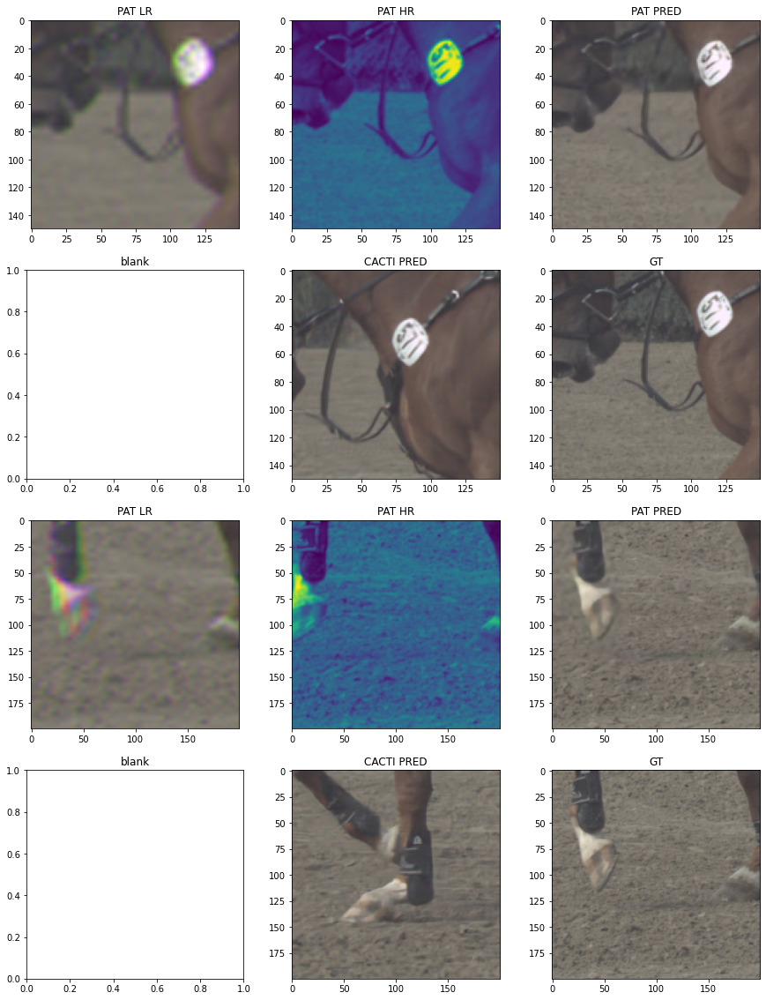

In [21]:
# compare one certain frame
cacti_file = './data/zongliang_result/Sep01_6_scene_full_frames/horses__000028_results_videoSCI_SlowFlow_6data_256mask_patch.mat'
frame_idx = 0
mat_dict = sio.loadmat(cacti_file)
cacti_pred = mat_dict['pred'][frame_idx]
aoi_list = [(slice(450, 600), slice(350, 500)), (slice(700, 900), slice(400, 600))]
_compare_aois(cv.resize(lr_trivial_stack, gt_wh, interpolation=cv.INTER_CUBIC),
              hr, pred, cacti_pred, gt, aoi_list)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


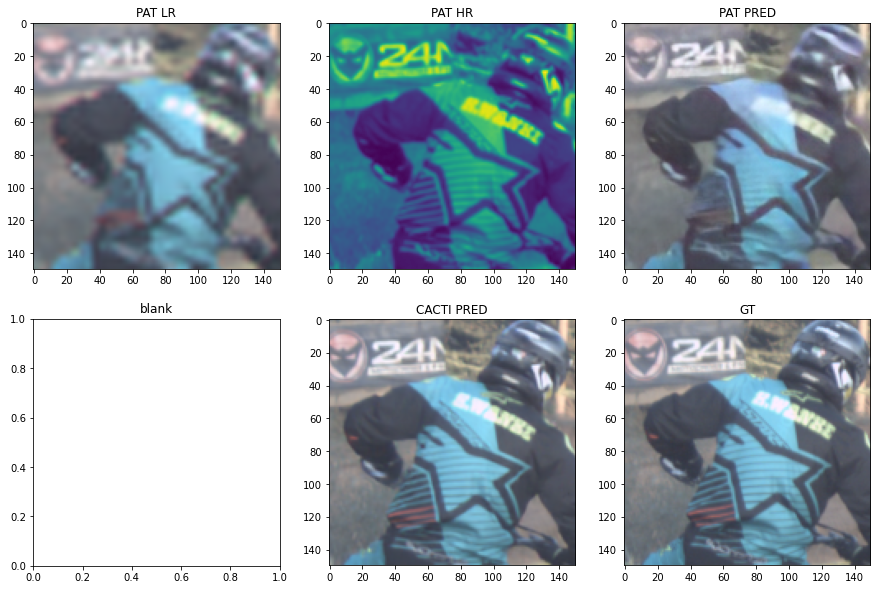

In [20]:
# compare one certain frame
cacti_file = './data/zongliang_result/Sep01_6_scene_full_frames/motocross_000001_results_videoSCI_SlowFlow_6data_256mask_patch.mat'
frame_idx = 0
mat_dict = sio.loadmat(cacti_file)
cacti_pred = mat_dict['pred'][frame_idx]
aoi_list = [(slice(350, 500), slice(120, 270)), ]
_compare_aois(cv.resize(lr_trivial_stack, gt_wh, interpolation=cv.INTER_CUBIC),
              hr, pred, cacti_pred, gt, aoi_list)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


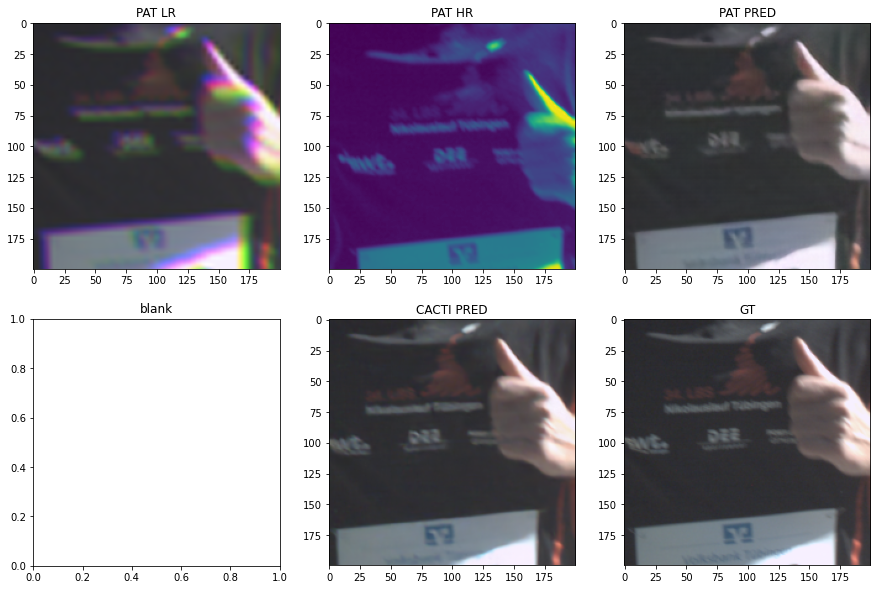

In [27]:
# compare one certain frame
cacti_file = './data/zongliang_result/Sep01_6_scene_full_frames/spitzberglauf_000076_results_videoSCI_SlowFlow_6data_256mask_patch.mat'
frame_idx = 0
mat_dict = sio.loadmat(cacti_file)
cacti_pred = mat_dict['pred'][frame_idx]
aoi_list = [(slice(600, 800), slice(750, 950)),]
_compare_aois(cv.resize(lr_trivial_stack, gt_wh, interpolation=cv.INTER_CUBIC),
              hr, pred, cacti_pred, gt, aoi_list)